**ESRGAN (Enhanced Super-Resolution Generative Adversarial Network)** is an advanced deep learning model designed to upscale low-resolution images to high-resolution images with increased detail and naturalism. ESRGAN extends SRGAN through the inclusion of important upgrades like Residual-in-Residual Dense Blocks (RRDB) without batch norm, which allow for deeper networks and better feature extraction, and perceptual loss combined with adversarial training to produce sharper, more realistic textures. Additionally, ESGRAN improves the discriminator with Relativistic GAN techniques such that the discriminator can differentiate better between real and generated images, leading to higher quality upscaling. With these improvements, ESGRAN is particularly suitable for photo restoration, medical imaging, and video enhancement applications where subtlety of detail and image fidelity are critical.

In [1]:
import torch 
import torch.nn as nn 
import torch.nn.functional as F
import os
import cv2
import numpy as np
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.models import vgg19
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# **Intilizing Variable Value**

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
lr = 1e-4
epochs = 50
batch_size = 8
num_workers = 4
high_res = 128
low_res = high_res // 4
num_channels = 3

cuda


# Model

**Making Dense Block**

In [3]:
class Convolution_Block(nn.Module):
    def __init__(self,in_channels,out_channels, use_act, kernel_size = 3, stride = 1,padding=1):
        super(Convolution_Block,self).__init__()
        self.cnn = nn.Conv2d(in_channels,out_channels,kernel_size=kernel_size,stride=stride,padding=padding)
        self.activation_fucntion = nn.LeakyReLU(0.2,inplace = True) if use_act else nn.Identity()
    def forward(self,x):
        return self.activation_fucntion(self.cnn(x))

class Dense_Block(nn.Module):
    def __init__(self, in_channels,channels = 32,residual_beta = 0.2):
        super(Dense_Block,self).__init__()
        self.residual_beta = residual_beta
        self.blocks = nn.ModuleList()

        for i in range(5):
            self.blocks.append(Convolution_Block(
                    in_channels + channels * i,
                    channels if i <= 3 else in_channels,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    use_act=True if i <=3 else False,))
    def forward(self,x):
        input = x 
        for block in self.blocks:
            out = block(input)
            input = torch.cat([input, out], dim=1)
        return self.residual_beta * out + x 

**Making Residual Dense Block**

In [4]:
class RRDB(nn.Module):
    def __init__(self, in_channels, residual_beta=0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.rrdb = nn.Sequential(*[Dense_Block(in_channels) for _ in range(3)])
    
    def forward(self, x):
        return self.rrdb(x) * self.residual_beta + x

**Making an Upsample Block**

In [5]:
class Upsample_Block(nn.Module):
    def __init__(self, in_channels, scale_factor=2):  # Changed to 2 since we do it twice
        super().__init__()
        self.upsample = nn.Upsample(
            scale_factor=scale_factor,
            mode='nearest'
        )
        self.conv = nn.Conv2d(
            in_channels, in_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=True
        )
        self.act = nn.LeakyReLU(0.2, inplace=True)
    
    def forward(self, x):
        return self.act(self.conv(self.upsample(x)))

**Making Generator ESRGAN**

In [6]:
class Generator(nn.Module):
    def __init__(self, input_channels=3, base_channels=64, num_residual_blocks=23):
        super().__init__()
        
        # Initial convolution
        self.initial_conv = nn.Conv2d(
            input_channels, base_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=True
        )
        
        # Residual blocks
        self.residual_blocks = nn.Sequential(
            *[RRDB(base_channels) for _ in range(num_residual_blocks)]
        )
        
        # Post-residual processing
        self.post_conv = nn.Conv2d(
            base_channels, base_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=True
        )
        
        # Upsampling (2x each, total 4x upscale)
        self.upsampling = nn.Sequential(
            Upsample_Block(base_channels),
            Upsample_Block(base_channels)
        )
        
        # Final output
        self.final = nn.Sequential(
            nn.Conv2d(
                base_channels, base_channels,
                kernel_size=3,
                stride=1,
                padding=1,
                bias=True
            ),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(
                base_channels, input_channels,
                kernel_size=1,
                stride=1,
                padding=0,
                bias=True
            )
        )
    
    def forward(self, x):
        # Initial features
        x0 = self.initial_conv(x)
        
        # Residual features
        x1 = self.residual_blocks(x0)
        x1 = self.post_conv(x1) + x0  # Skip connection
        
        # Upsampling
        x2 = self.upsampling(x1)
        
        # Final output
        return self.final(x2)


**Testing Model Input and Output**

In [7]:
def test_model():
    
    model = Generator()
    dummy_input = torch.randn(32, 3, 32, 32)
    
    try:
        output = model(dummy_input)
        assert output.shape == (32, 3, 128, 128), \
            f"Output shape {output.shape} is not (1, 3, 256, 256)"
        print("Model test passed successfully!")
        print(f"Input shape: {dummy_input.shape}")
        print(f"Output shape: {output.shape}")
    except Exception as e:
        print(f"Model test failed: {str(e)}")
        raise
test_model()

Model test passed successfully!
Input shape: torch.Size([32, 3, 32, 32])
Output shape: torch.Size([32, 3, 128, 128])


**Creating Descriminator**

In [8]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, use_act=True):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels, out_channels, kernel_size, stride, padding, bias=True
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.conv(x)

class Discriminator(nn.Module):
    def __init__(self, in_channels=3, feature_maps=(64, 64, 128, 128, 256, 256, 512, 512)):
        super().__init__()
        
        # Feature extraction backbone
        conv_blocks = []
        current_channels = in_channels
        
        for idx, num_filters in enumerate(feature_maps):
            conv_blocks.append(
                ConvBlock(
                    in_channels=current_channels,
                    out_channels=num_filters,
                    kernel_size=3,
                    stride=1 + idx % 2,  # Alternate stride 1 and 2
                    padding=1,
                    use_act=True
                )
            )
            current_channels = num_filters

        self.feature_extractor = nn.Sequential(*conv_blocks)

        # Classifier head (adapted for 128x128 input)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),  # Works for both 32x32 and 128x128 after feature extraction
            nn.Flatten(),
            nn.Linear(512*6*6, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1)
        )

    def forward(self, x):
        features = self.feature_extractor(x)
        return self.classifier(features)

**Testing Descriminator**

In [9]:
disc = Discriminator()
dummy_input = torch.randn(15, 3, 128, 128)
output = disc(dummy_input)
print(output.shape)

torch.Size([15, 1])


# **Loss Function**

In [10]:
class FeatureMatchingLoss(nn.Module):
    def __init__(self, compute_device):
        super().__init__()
        # Pretrained VGG19 feature extractor
        self.feature_net = vgg19(pretrained=True).features[:35].eval().to(compute_device)
        self.distance_metric = nn.MSELoss()
        
        # Disable gradient for feature extractor
        for layer in self.feature_net.parameters():
            layer.requires_grad = False

    def forward(self, generated_img, reference_img):
        # Compare deep features
        gen_features = self.feature_net(generated_img)
        ref_features = self.feature_net(reference_img)
        return self.distance_metric(gen_features, ref_features)

class TotalLoss(nn.Module):
    def __init__(self, pixel_weight=1e-2, feature_weight=1, compute_device='cpu'):
        super().__init__()
        self.feature_loss = FeatureMatchingLoss(compute_device)
        self.pixel_loss = nn.L1Loss().to(compute_device)
        self.pixel_coeff = pixel_weight
        
    def forward(self, output_img, target_img):
        # Combined loss calculation
        deep_loss = self.feature_loss(output_img, target_img)
        pixel_diff = self.pixel_loss(output_img, target_img)
        return deep_loss + self.pixel_coeff * pixel_diff

def gradient_penalty(critic, real, fake, device):
    batch_size, channels, height, width = real.shape
    alpha = torch.rand((batch_size, 1, 1, 1)).repeat(1, channels, height, width).to(device)
    interpolated_images = real * alpha + fake.detach() * (1 - alpha)
    interpolated_images.requires_grad_(True)

    mixed_scores = critic(interpolated_images)

    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)

    return gradient_penalty

# **Creating Dataset**

To download the dataset from the Kaggle DIV2k dataset for this experiment, I provide the code below to download the dataset first and then create the dataset before training the model.

In [11]:
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("sharansmenon/div2k")

# print("Path to dataset files:", path)

In [ ]:
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("ll01dm/set-5-14-super-resolution-dataset")

# print("Path to dataset files:", path)

In [12]:
class SuperResolutionImageSet(Dataset):
    def __init__(self, data_folder, lr_augment, hr_augment, joint_augment):
        super(SuperResolutionImageSet, self).__init__()
        
        self.data_path = data_folder
        
        self.lr_preprocess = lr_augment
        self.hr_preprocess = hr_augment
        self.joint_preprocess = joint_augment
        
        self.file_names = os.listdir(os.path.join(data_folder))

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        img_data = cv2.imread(os.path.join(self.data_path, self.file_names[idx]))
        img_data = cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB)
        
        img_data = self.joint_preprocess(image=img_data)['image']
        lr_img = self.lr_preprocess(image=img_data)['image']
        hr_img = self.hr_preprocess(image=img_data)['image']
        
        return lr_img, hr_img

In [13]:
hr_preprocessing = A.Compose(
    [
        A.Resize(width=high_res, height=high_res),
        A.Normalize(mean=[0, 0, 0], std=[1, 1, 1]),
        ToTensorV2(),
    ]
)

lr_preprocessing = A.Compose(
    [
        A.Resize(width=low_res, height=low_res, interpolation=Image.BICUBIC),
        A.Normalize(mean=[0, 0, 0], std=[1, 1, 1]),
        ToTensorV2(),
    ]
)

augmentation_pipeline = A.Compose(
    [
        A.RandomCrop(width=high_res, height=high_res),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
    ]
)

In [24]:
train_dataset = SuperResolutionImageSet(
    data_folder = '/kaggle/input/div2k/DIV2K_train_HR/DIV2K_train_HR',
    lr_augment = lr_preprocessing,
    hr_augment = hr_preprocessing,
    joint_augment = augmentation_pipeline
)

val_dataset = SuperResolutionImageSet(
    data_folder = '/kaggle/input/set-5-14-super-resolution-dataset/Set14/Set14',
    lr_augment = lr_preprocessing,
    hr_augment = hr_preprocessing,
    joint_augment = augmentation_pipeline
)

**Displaying some samples from training dataset**

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(14, 7))

for i, (low_res, high_res) in enumerate(train_dataset):
    if i >= 5:
        break
    
    # Convert tensors to numpy arrays
    lr_img = low_res.numpy().transpose(1, 2, 0)
    hr_img = high_res.numpy().transpose(1, 2, 0)
    
    # Display images
    axes[0, i].imshow(lr_img)
    axes[0, i].set_title("Low Resolution")
    axes[0, i].axis('off')

    axes[1, i].imshow(hr_img)
    axes[1, i].set_title("High Resolution")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

# **Training Model**

**Intilizing Model and Optimization function**

In [ ]:
Generator = Generator().to(device)
Discriminator = Discriminator().to(device)

# Optimizier 
optimizer_generator = torch.optim.Adam(Generator.parameters(), lr=lr, betas=(0.0, 0.9))
optimizer_discriminator = torch.optim.Adam(Discriminator.parameters(), lr=lr, betas=(0.0, 0.9))

In [17]:
Generator_loss = TotalLoss(compute_device=device)

generator_scaler = torch.cuda.amp.GradScaler()
discriminator_scaler = torch.cuda.amp.GradScaler()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 206MB/s] 
<ipython-input-17-40c0e6936901>:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  generator_scaler = torch.cuda.amp.GradSca

In [18]:
train_dataloader = torch.utils.data.DataLoader(train_dataset,num_workers=4,batch_size=batch_size,shuffle=True,pin_memory=True)
loss_G = TotalLoss(device)


Epoch 1/50:   0%|          | 0/100 [00:00<?, ?it/s]<ipython-input-20-c29dd7b2f0dc>:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
<ipython-input-20-c29dd7b2f0dc>:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 1/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.3040, D Loss=5.6071, GP=0.7496] 


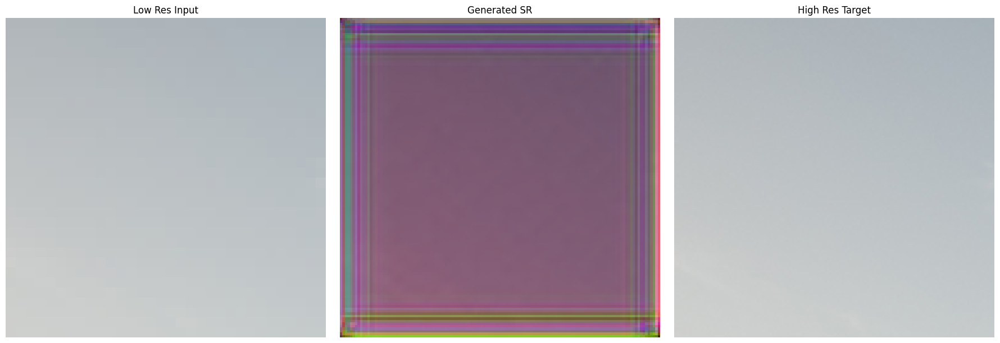

Saved checkpoint at epoch 1


Epoch 2/50: 100%|██████████| 100/100 [00:40<00:00,  2.46it/s, G Loss=1.2528, D Loss=0.0079, GP=0.1102]


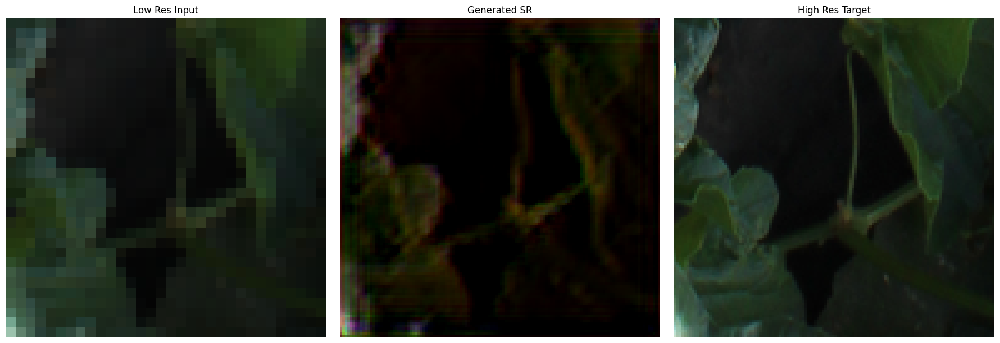

Saved checkpoint at epoch 2


Epoch 3/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.5454, D Loss=3.8239, GP=0.4987]


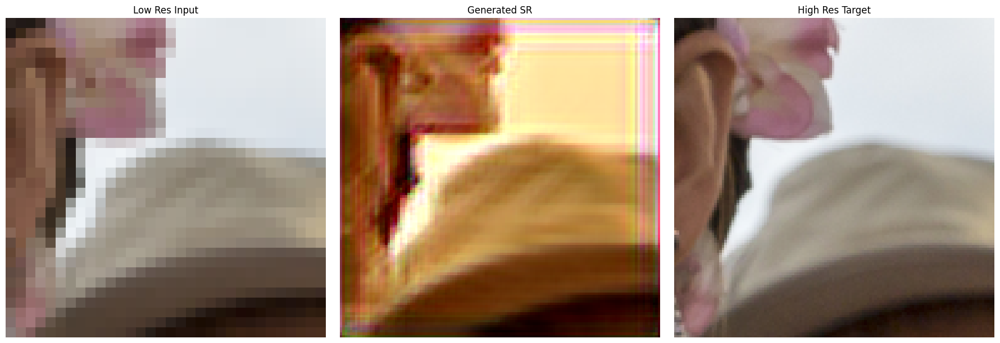

Saved checkpoint at epoch 3


Epoch 4/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=2.2932, D Loss=1.7604, GP=0.2229]


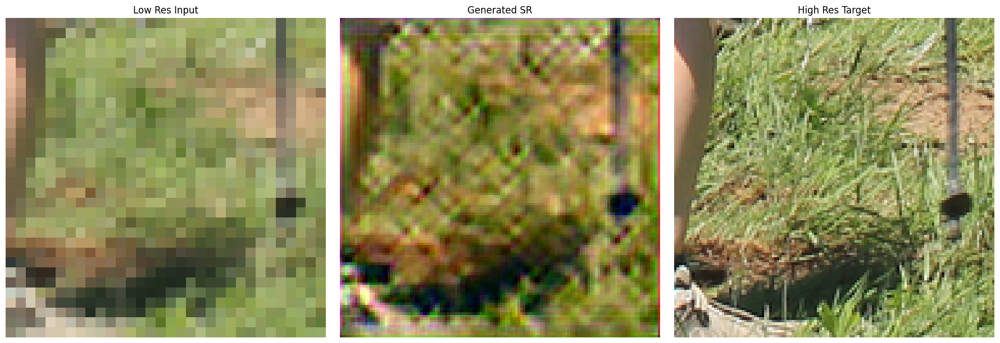

Saved checkpoint at epoch 4


Epoch 5/50: 100%|██████████| 100/100 [00:39<00:00,  2.50it/s, G Loss=0.8928, D Loss=1.5544, GP=0.2238]


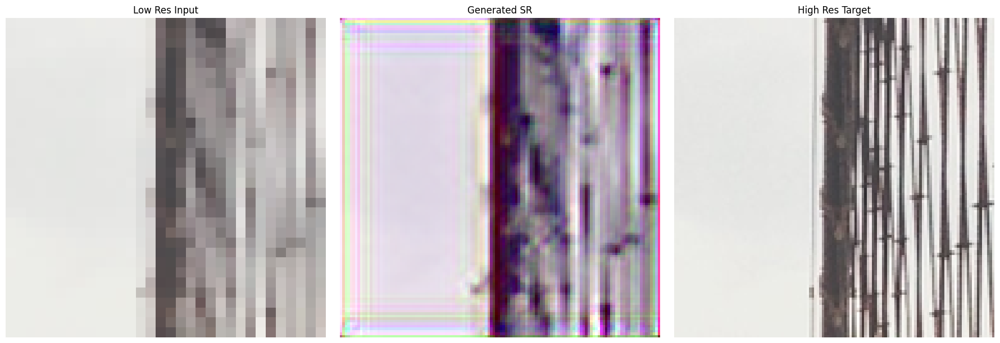

Saved checkpoint at epoch 5


Epoch 6/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=1.1663, D Loss=2.3270, GP=0.3097]


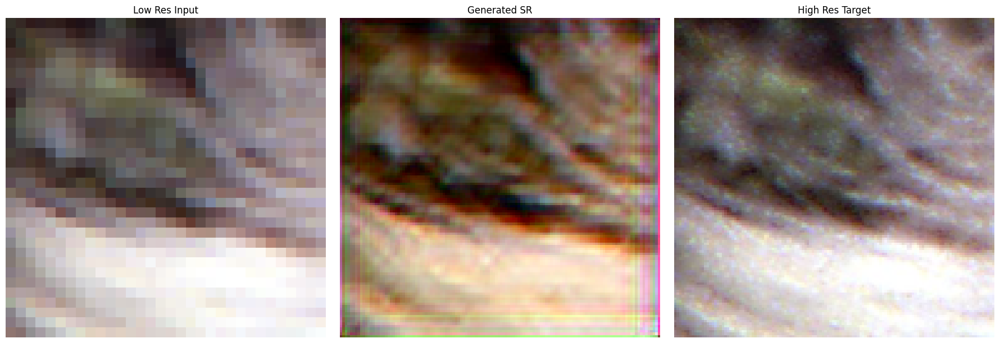

Saved checkpoint at epoch 6


Epoch 7/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.5840, D Loss=6.5639, GP=0.7176]


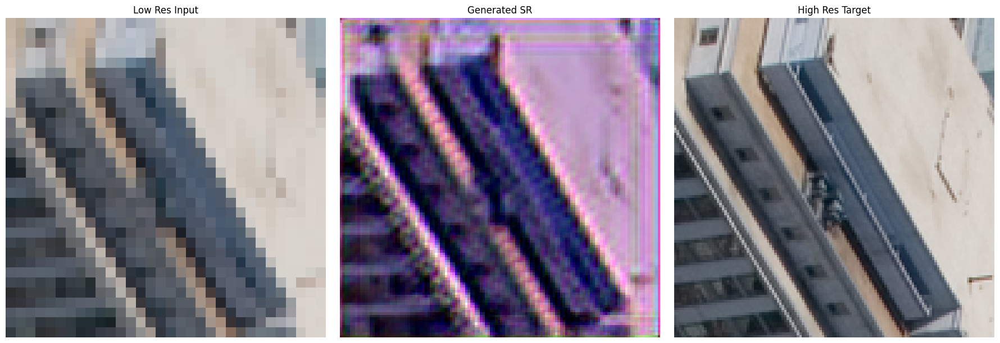

Saved checkpoint at epoch 7


Epoch 8/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.0205, D Loss=2.8189, GP=0.3448]


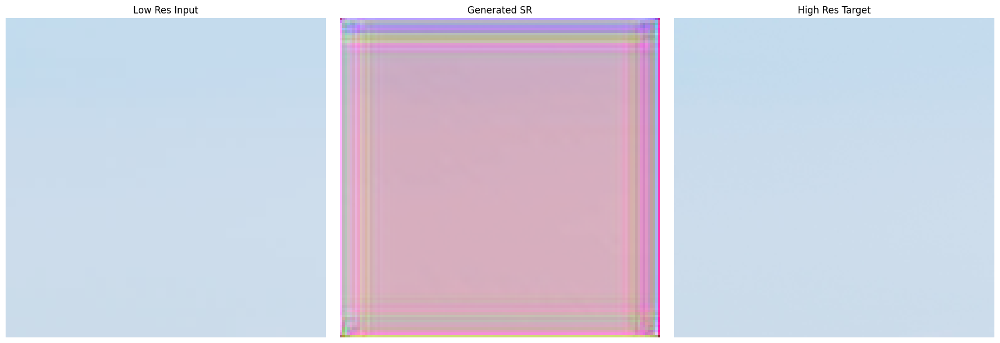

Saved checkpoint at epoch 8


Epoch 9/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=0.9148, D Loss=1.3743, GP=0.1946]


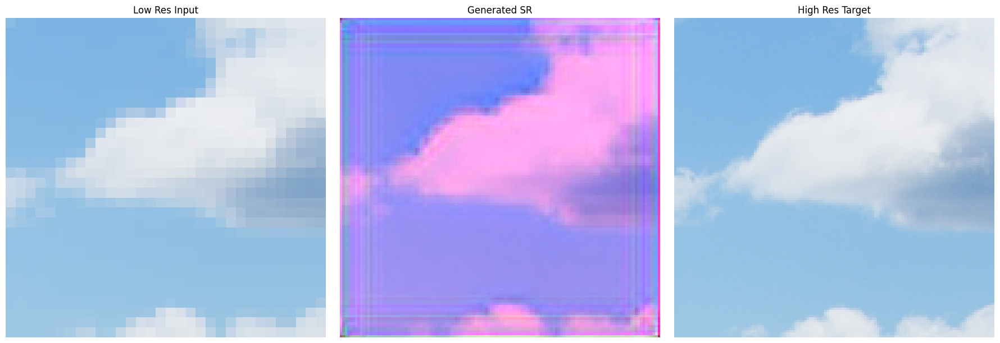

Saved checkpoint at epoch 9


Epoch 10/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.2517, D Loss=2.9082, GP=0.3510]


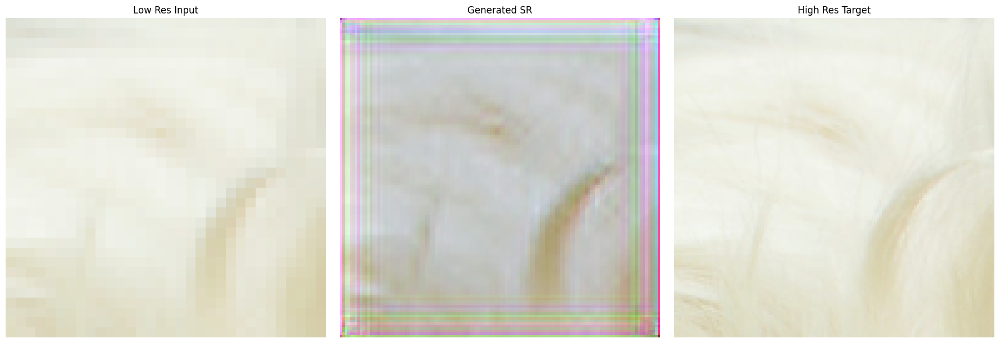

Saved checkpoint at epoch 10


Epoch 11/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=2.9851, D Loss=-0.2339, GP=0.0032]


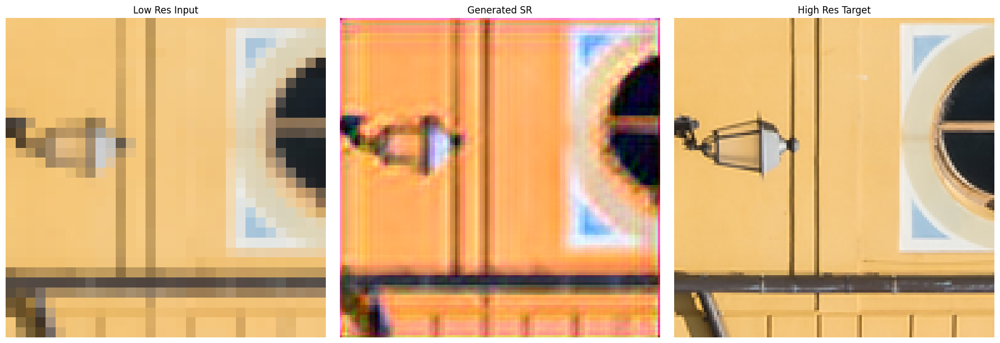

Saved checkpoint at epoch 11


Epoch 12/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=1.4827, D Loss=2.9646, GP=0.3295]


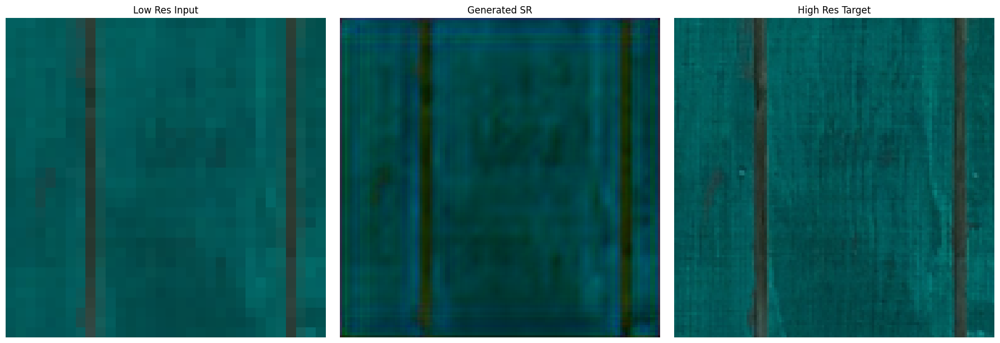

Saved checkpoint at epoch 12


Epoch 13/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=1.1884, D Loss=2.9643, GP=0.3547]


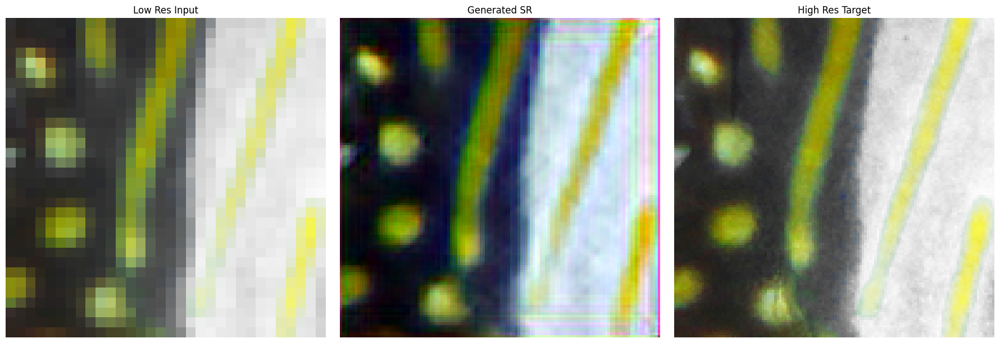

Saved checkpoint at epoch 13


Epoch 14/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.2728, D Loss=-0.1691, GP=0.0118]


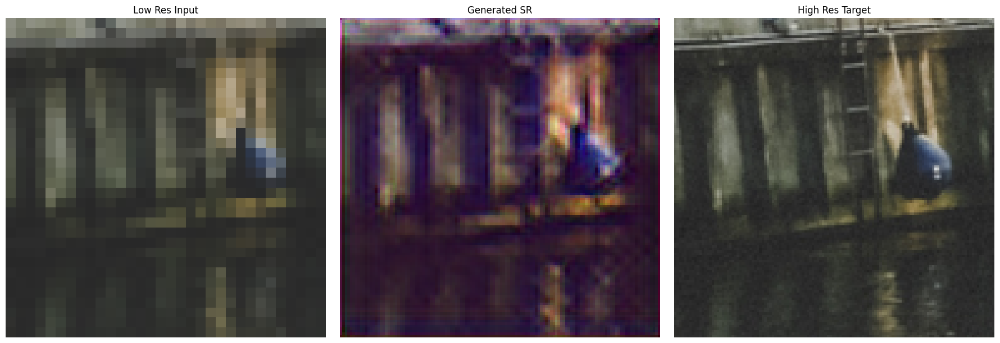

Saved checkpoint at epoch 14


Epoch 15/50: 100%|██████████| 100/100 [00:40<00:00,  2.50it/s, G Loss=1.9166, D Loss=0.0508, GP=0.0348]


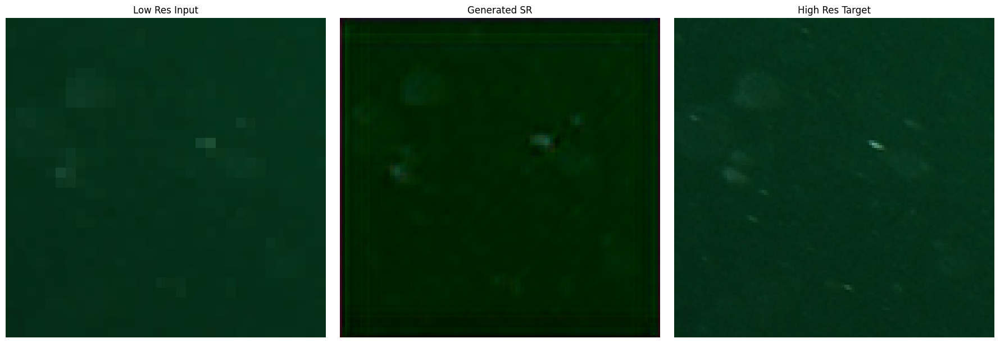

Saved checkpoint at epoch 15


Epoch 16/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.4608, D Loss=0.0139, GP=0.0408]


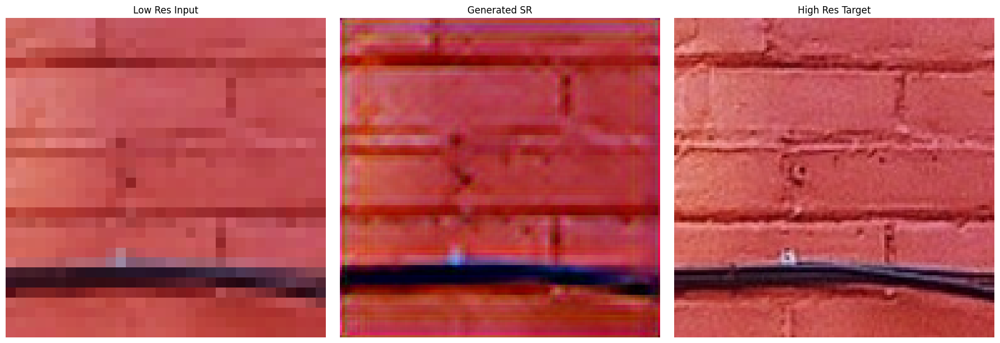

Saved checkpoint at epoch 16


Epoch 17/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.3709, D Loss=1.1842, GP=0.1577]


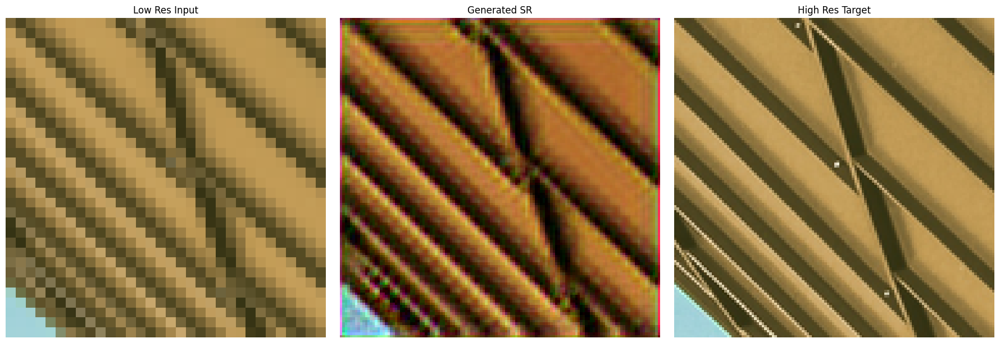

Saved checkpoint at epoch 17


Epoch 18/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.1693, D Loss=-0.3038, GP=0.0125]


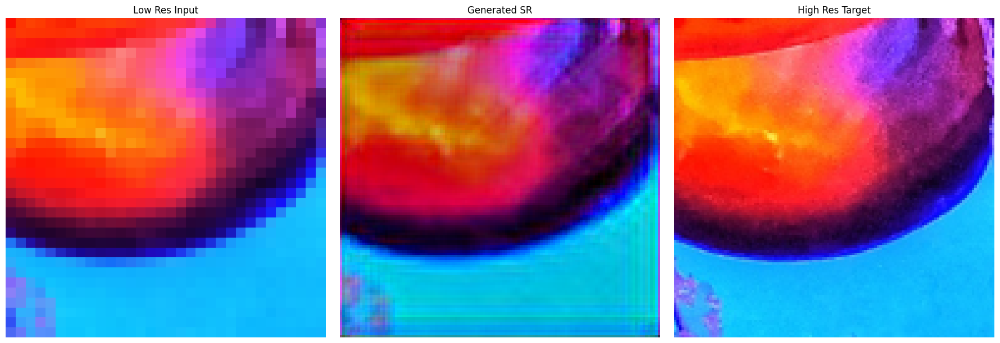

Saved checkpoint at epoch 18


Epoch 19/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.9773, D Loss=0.5016, GP=0.0810]


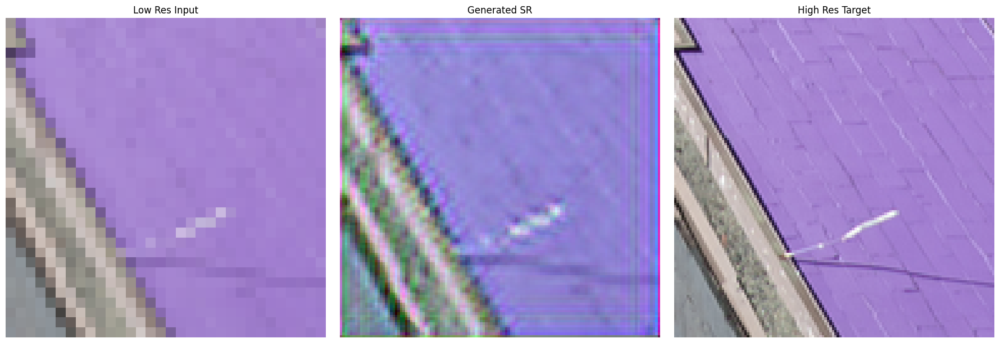

Saved checkpoint at epoch 19


Epoch 20/50: 100%|██████████| 100/100 [00:40<00:00,  2.50it/s, G Loss=1.5068, D Loss=4.9232, GP=0.5221]


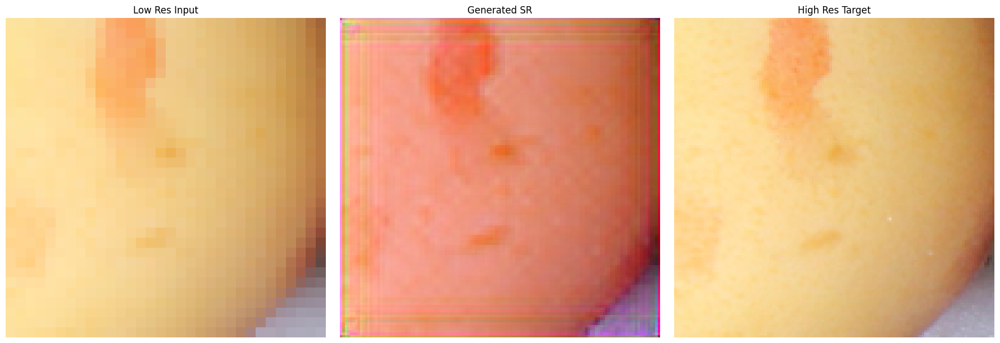

Saved checkpoint at epoch 20


Epoch 21/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.9667, D Loss=0.2863, GP=0.0671]


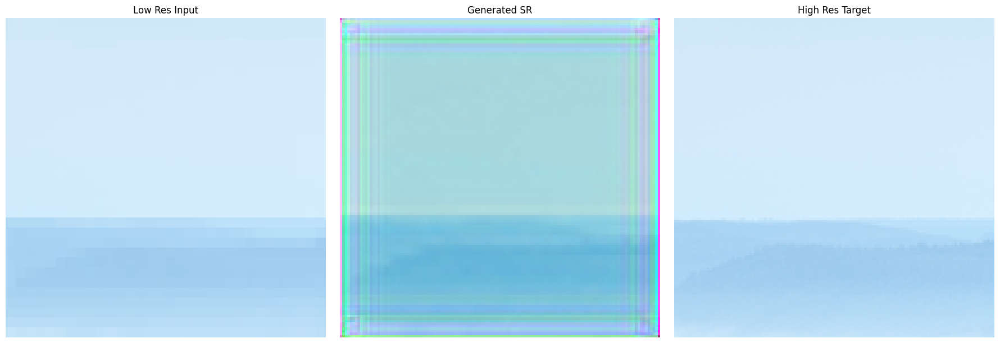

Saved checkpoint at epoch 21


Epoch 22/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.5438, D Loss=1.9432, GP=0.2317]


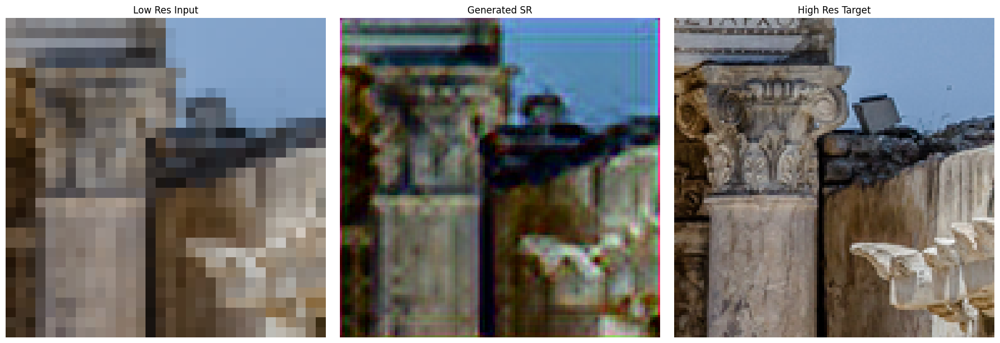

Saved checkpoint at epoch 22


Epoch 23/50: 100%|██████████| 100/100 [00:40<00:00,  2.50it/s, G Loss=1.2067, D Loss=1.2448, GP=0.1562]


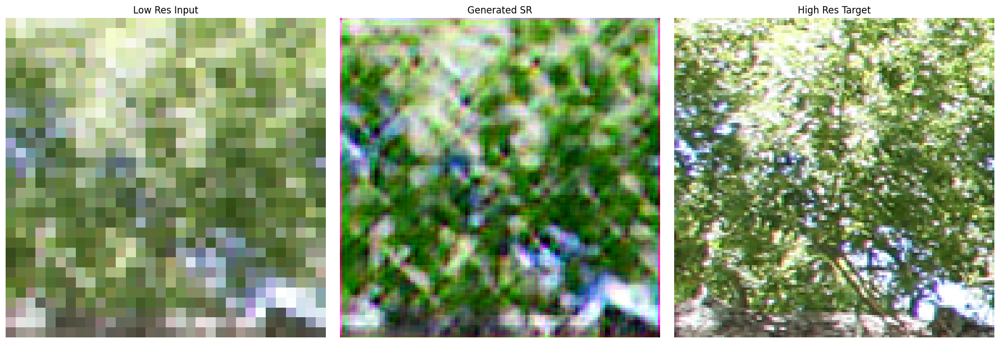

Saved checkpoint at epoch 23


Epoch 24/50: 100%|██████████| 100/100 [00:40<00:00,  2.50it/s, G Loss=1.0336, D Loss=-0.0989, GP=0.0122]


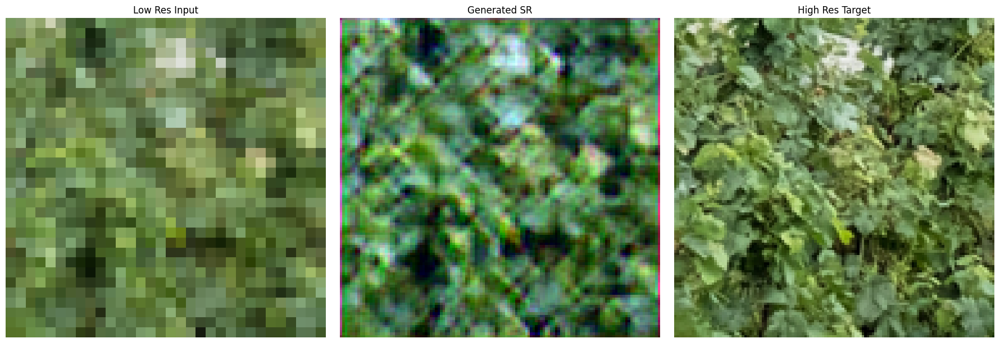

Saved checkpoint at epoch 24


Epoch 25/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.6815, D Loss=-0.0919, GP=0.0303]


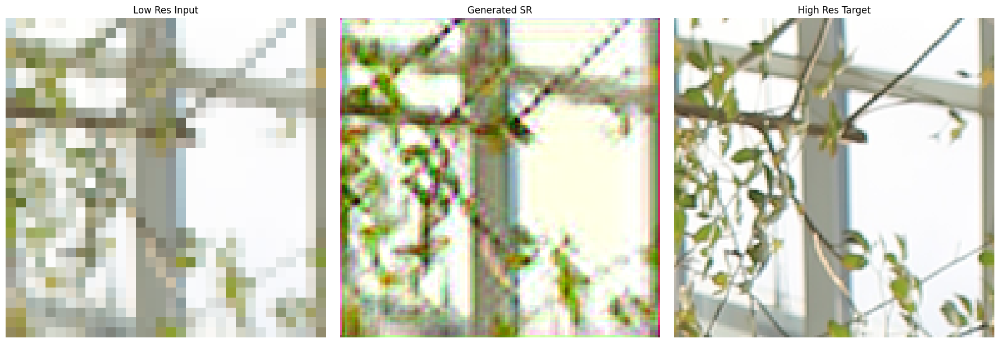

Saved checkpoint at epoch 25


Epoch 26/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=2.2933, D Loss=1.1069, GP=0.1602]


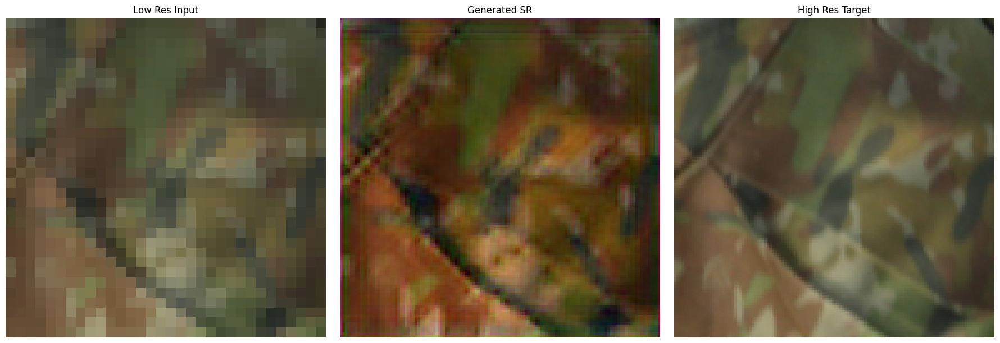

Saved checkpoint at epoch 26


Epoch 27/50: 100%|██████████| 100/100 [00:39<00:00,  2.50it/s, G Loss=1.5360, D Loss=0.2739, GP=0.0536]


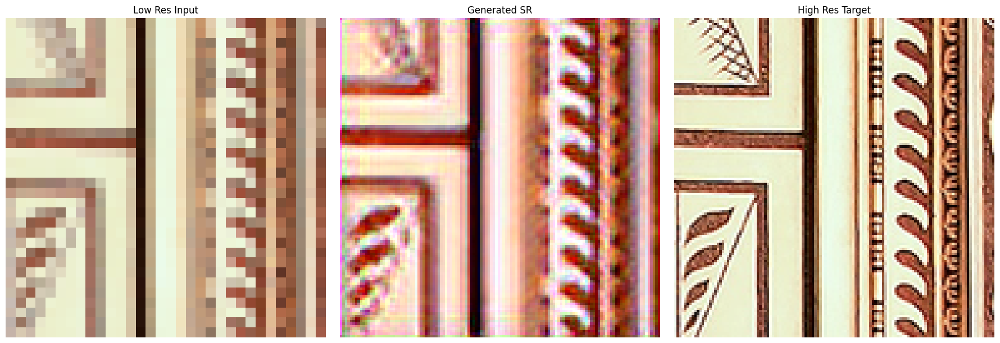

Saved checkpoint at epoch 27


Epoch 28/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.5303, D Loss=0.5277, GP=0.0784]


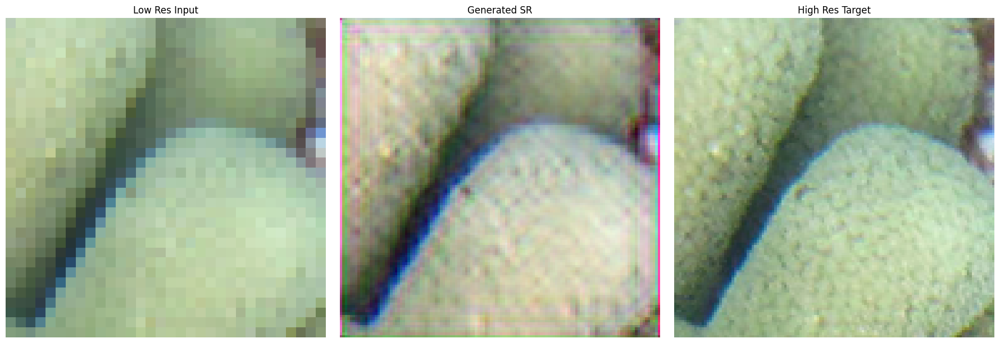

Saved checkpoint at epoch 28


Epoch 29/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.3742, D Loss=0.3196, GP=0.0767]


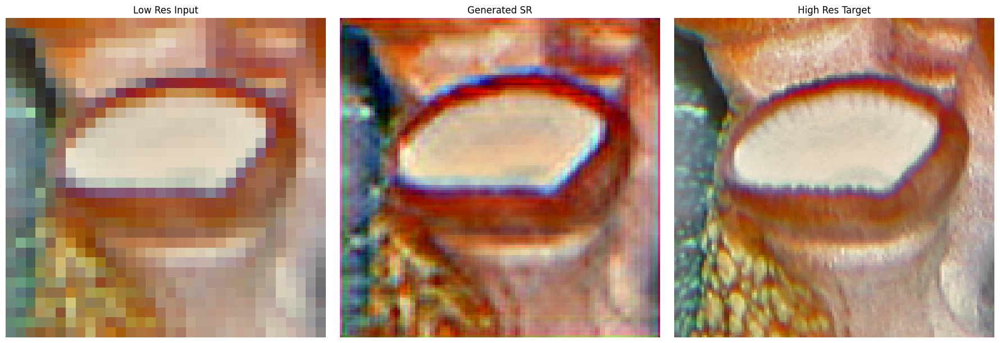

Saved checkpoint at epoch 29


Epoch 30/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=1.7755, D Loss=0.9357, GP=0.1215]


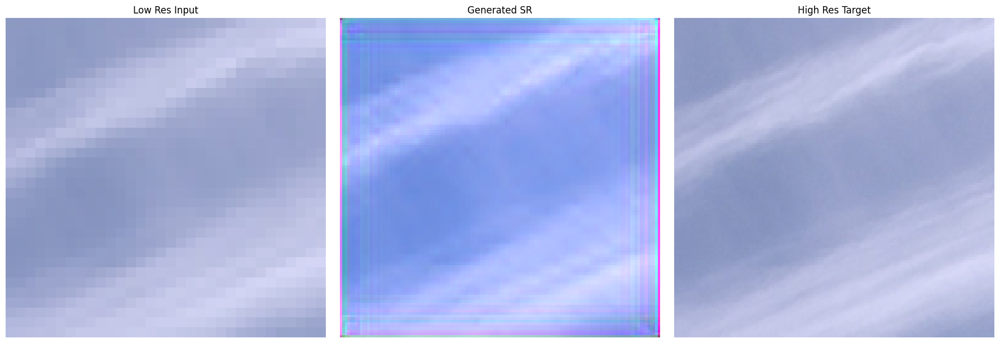

Saved checkpoint at epoch 30


Epoch 31/50: 100%|██████████| 100/100 [00:39<00:00,  2.53it/s, G Loss=1.1731, D Loss=1.2791, GP=0.1712]


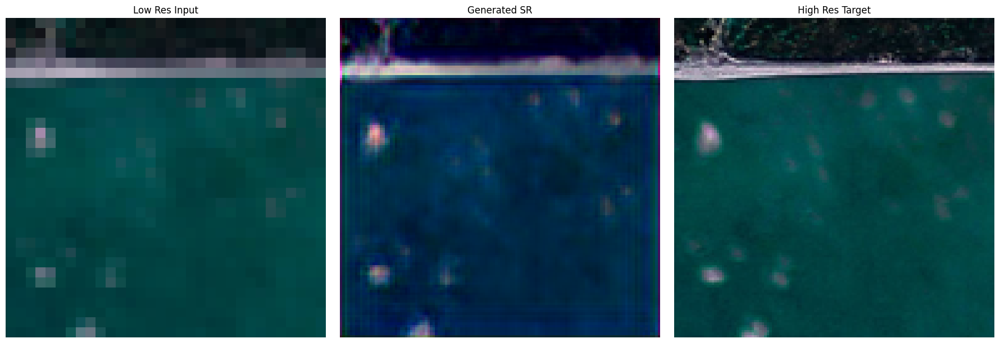

Saved checkpoint at epoch 31


Epoch 32/50: 100%|██████████| 100/100 [00:39<00:00,  2.50it/s, G Loss=1.3468, D Loss=1.7300, GP=0.2013]


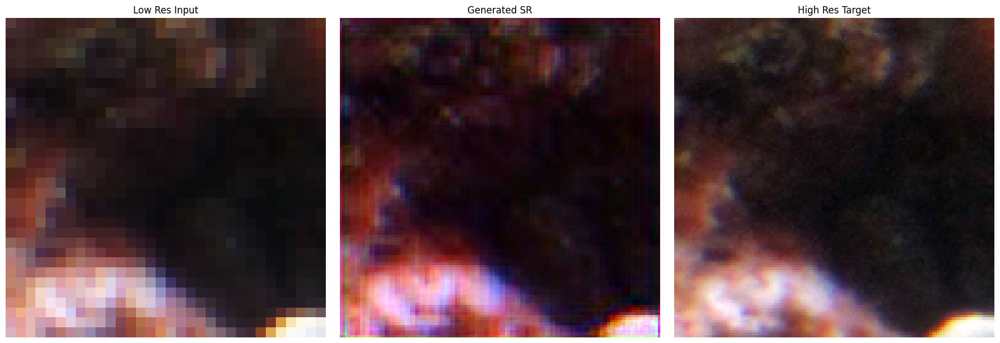

Saved checkpoint at epoch 32


Epoch 33/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=0.5280, D Loss=1.1533, GP=0.1606]


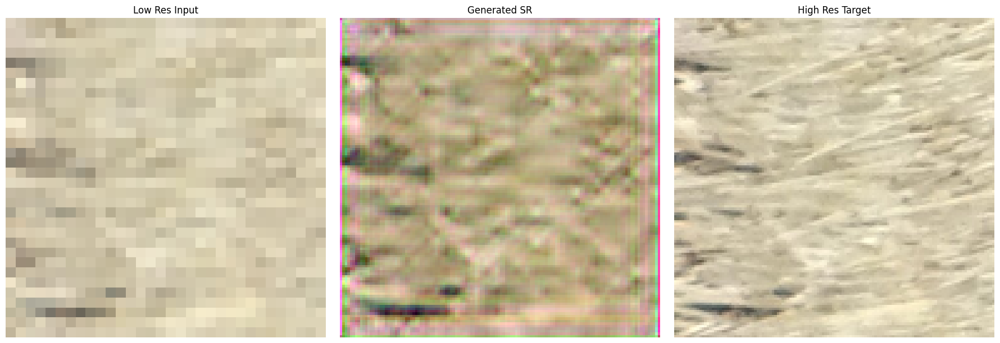

Saved checkpoint at epoch 33


Epoch 34/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=0.5869, D Loss=2.3928, GP=0.2667]


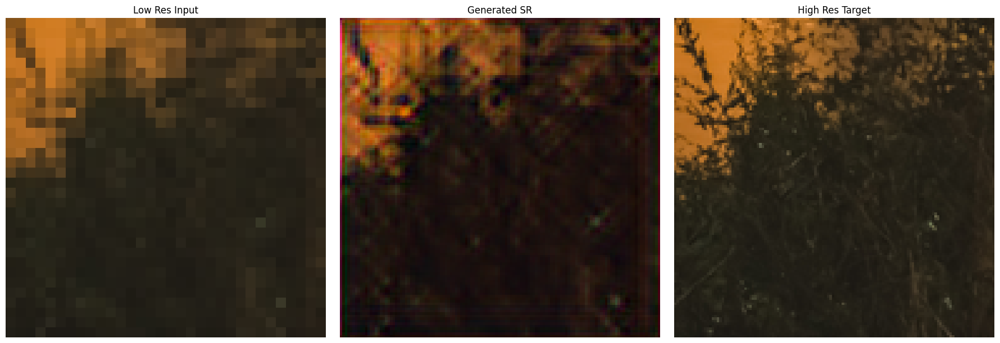

Saved checkpoint at epoch 34


Epoch 35/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.8881, D Loss=0.5662, GP=0.0929]


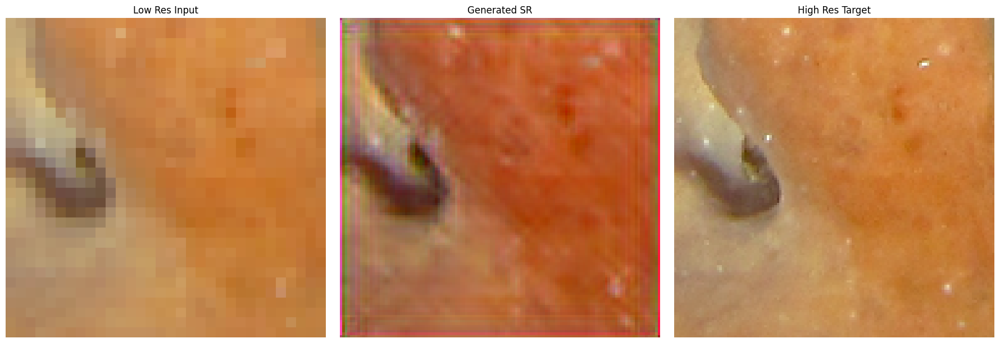

Saved checkpoint at epoch 35


Epoch 36/50: 100%|██████████| 100/100 [00:39<00:00,  2.53it/s, G Loss=1.3085, D Loss=0.7977, GP=0.0965]


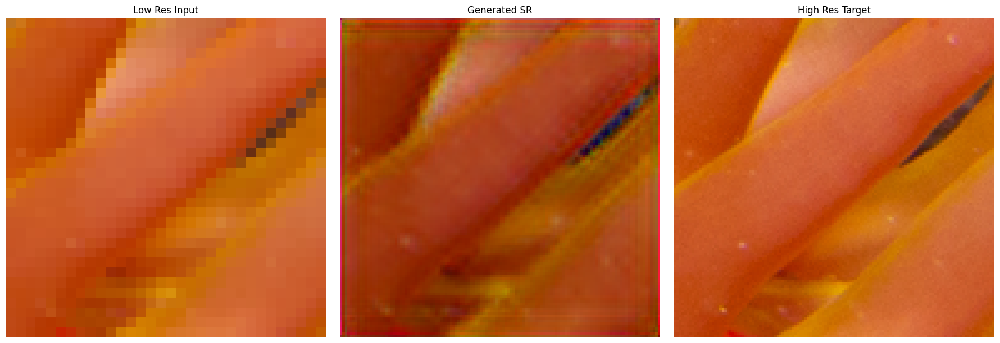

Saved checkpoint at epoch 36


Epoch 37/50: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s, G Loss=0.9839, D Loss=4.3564, GP=0.4753]


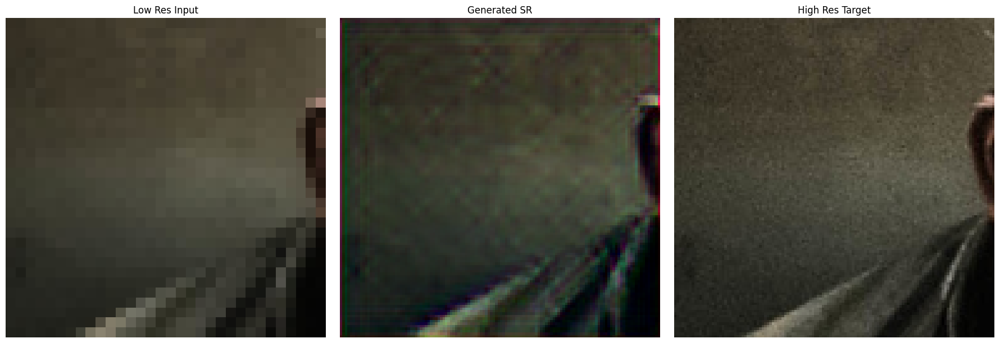

Saved checkpoint at epoch 37


Epoch 38/50: 100%|██████████| 100/100 [00:39<00:00,  2.53it/s, G Loss=1.2419, D Loss=0.1359, GP=0.0586]


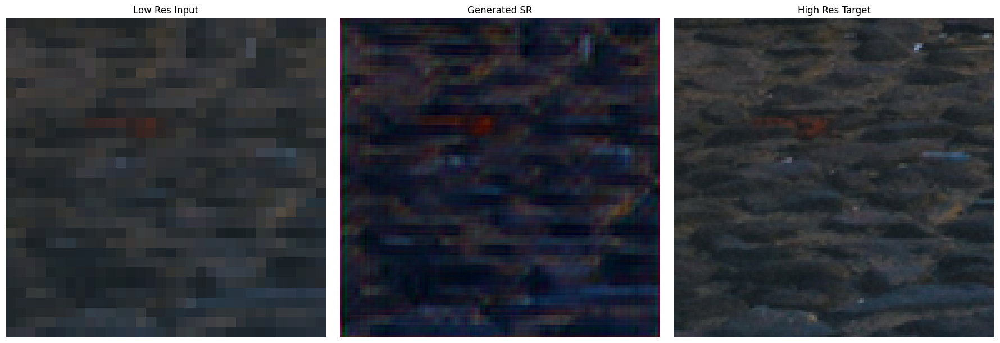

Saved checkpoint at epoch 38


Epoch 39/50: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s, G Loss=1.5464, D Loss=1.5282, GP=0.1652]


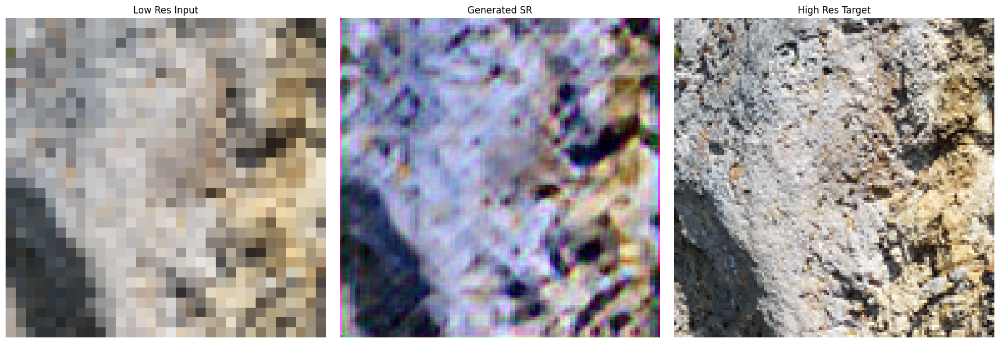

Saved checkpoint at epoch 39


Epoch 40/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.0312, D Loss=8.0432, GP=0.8401]


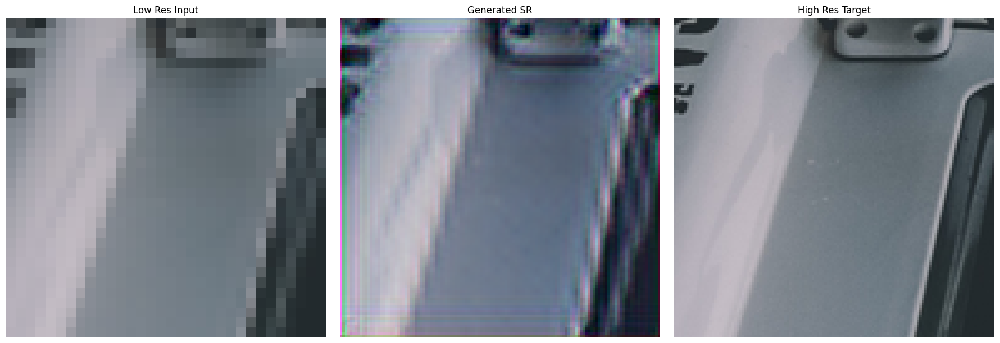

Saved checkpoint at epoch 40


Epoch 41/50: 100%|██████████| 100/100 [00:40<00:00,  2.50it/s, G Loss=1.2260, D Loss=0.7728, GP=0.1234]


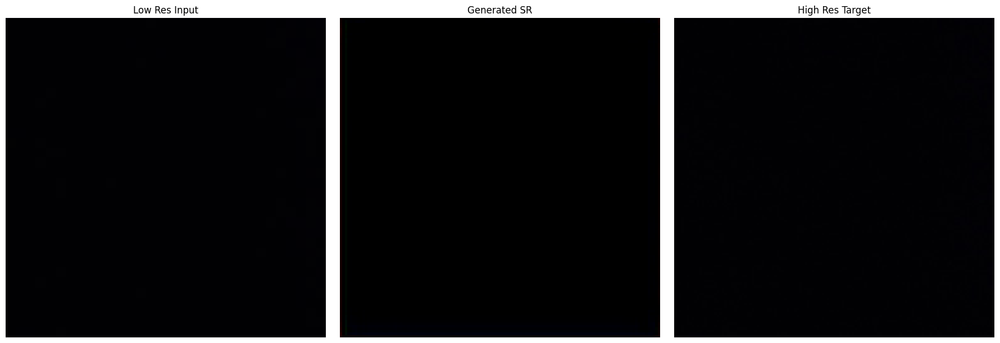

Saved checkpoint at epoch 41


Epoch 42/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=1.3854, D Loss=0.0617, GP=0.0277]


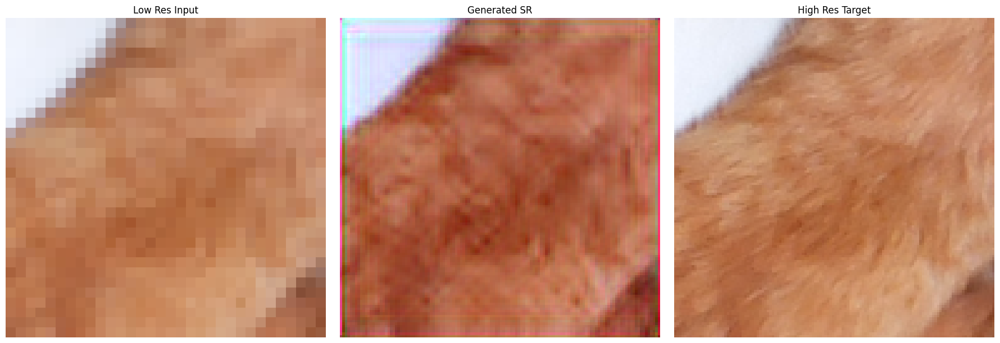

Saved checkpoint at epoch 42


Epoch 43/50: 100%|██████████| 100/100 [00:39<00:00,  2.53it/s, G Loss=0.9905, D Loss=2.7748, GP=0.3084]


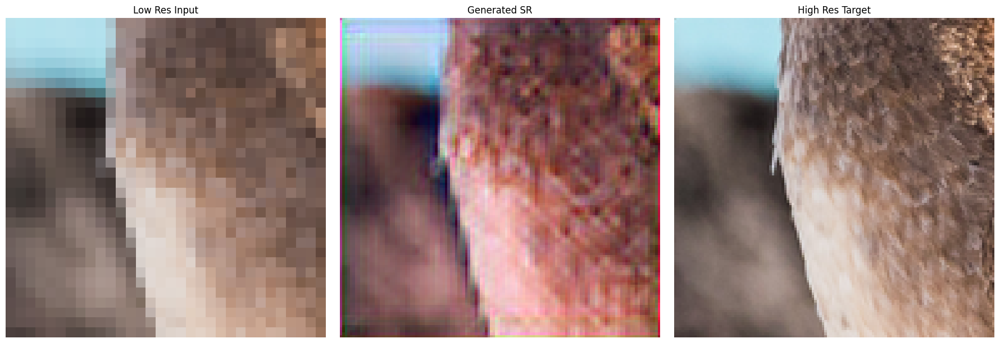

Saved checkpoint at epoch 43


Epoch 44/50: 100%|██████████| 100/100 [00:40<00:00,  2.48it/s, G Loss=1.4795, D Loss=-0.0785, GP=0.0168]


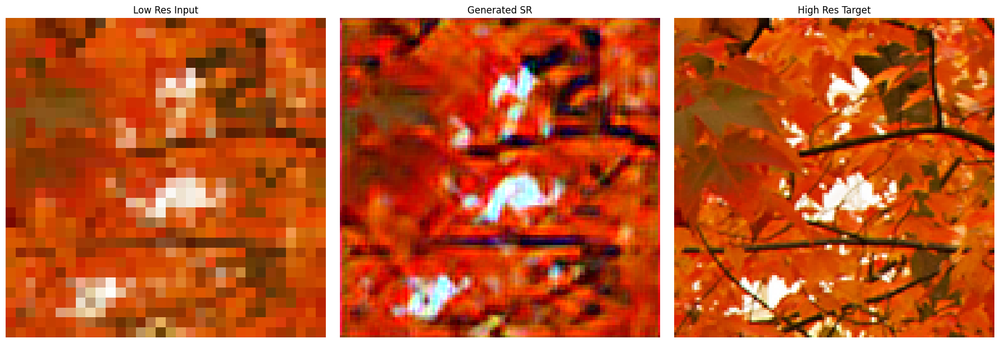

Saved checkpoint at epoch 44


Epoch 45/50: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s, G Loss=2.4805, D Loss=0.0453, GP=0.0334]


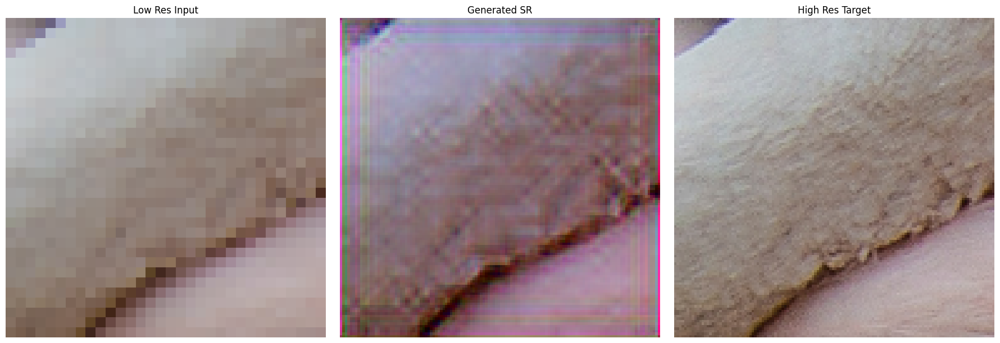

Saved checkpoint at epoch 45


Epoch 46/50: 100%|██████████| 100/100 [00:39<00:00,  2.53it/s, G Loss=2.1030, D Loss=-0.1748, GP=0.0212]


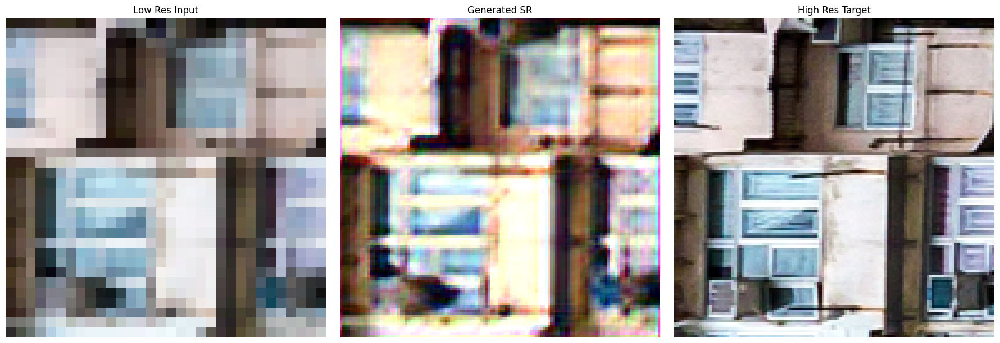

Saved checkpoint at epoch 46


Epoch 47/50: 100%|██████████| 100/100 [00:38<00:00,  2.58it/s, G Loss=nan, D Loss=nan, GP=nan]         


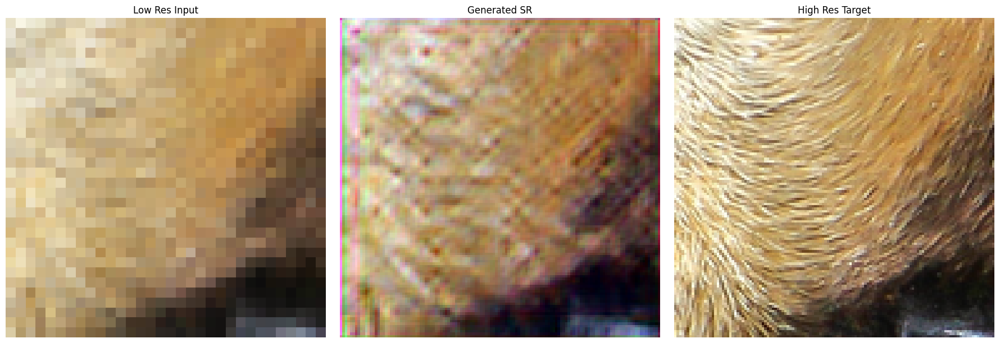

Saved checkpoint at epoch 47


Epoch 48/50: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s, G Loss=nan, D Loss=nan, GP=nan]


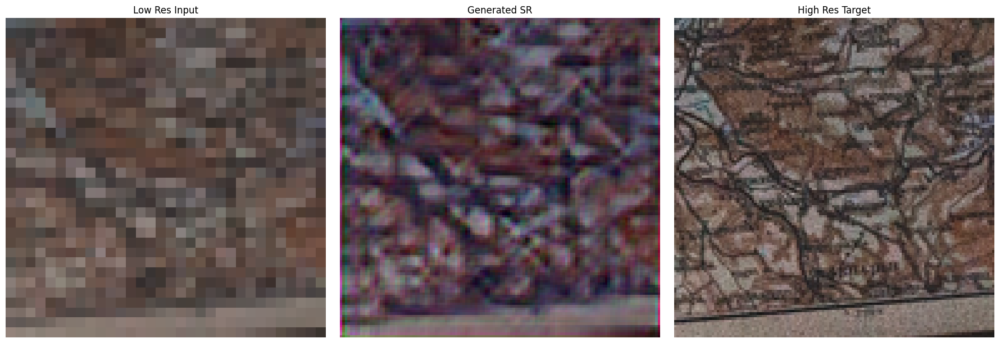

Saved checkpoint at epoch 48


Epoch 49/50: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s, G Loss=nan, D Loss=nan, GP=nan]


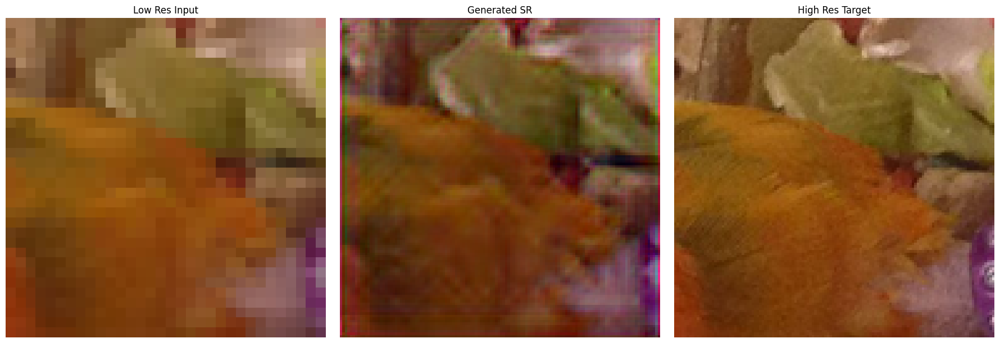

Saved checkpoint at epoch 49


Epoch 50/50: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s, G Loss=nan, D Loss=nan, GP=nan]


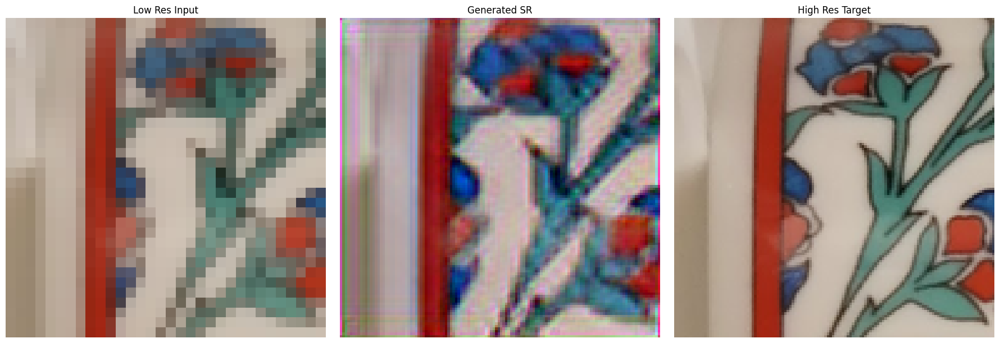

Saved checkpoint at epoch 50


In [ ]:
for epoch in range(epochs):
    # Set models to training mode
    Generator.train()
    Discriminator.train()
    total_g_loss = 0.0
    total_d_loss = 0.0
    num_batches = len(train_dataloader)
    batch_iter = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=True)
    
    for batch_idx, (lr_batch, hr_batch) in enumerate(batch_iter):
        LR = lr_batch.to(device)
        HR = hr_batch.to(device)
        with torch.cuda.amp.autocast():
            fake = Generator(LR)
            disc_real = Discriminator(HR)
            disc_fake = Discriminator(fake.detach())
            gp = gradient_penalty(Discriminator, HR, fake, device)
            loss_D = (-(torch.mean(disc_real) - torch.mean(disc_fake)) + 10 * gp)
            
        optimizer_discriminator.zero_grad()
        discriminator_scaler.scale(loss_D).backward()
        discriminator_scaler.step(optimizer_discriminator)
        discriminator_scaler.update()

        
        with torch.cuda.amp.autocast():
           
            content_loss = Generator_loss(fake, HR)
            
            
            disc_fake_for_g = Discriminator(fake)
            disc_real_for_g = Discriminator(HR).detach()
            adversarial_loss = F.binary_cross_entropy_with_logits(
                disc_fake_for_g - disc_real_for_g.mean(0, keepdim=True),
                torch.ones_like(disc_fake_for_g),
                reduction='mean'
            )
            loss_G = content_loss + 5e-3 * adversarial_loss
        
        optimizer_generator.zero_grad()
        generator_scaler.scale(loss_G).backward()
        generator_scaler.step(optimizer_generator)
        generator_scaler.update()

        total_g_loss = min(total_g_loss,loss_G.item())
        total_d_loss = min(total_d_loss,loss_D.item())

        batch_iter.set_postfix({
            "G Loss": f"{loss_G.item():.4f}",
            "D Loss": f"{loss_D.item():.4f}",
            "GP": f"{gp.item():.4f}"
        })
        
    with torch.no_grad():
            
        sample_fake = fake[0].cpu().clamp(0, 1).permute(1, 2, 0).float().numpy()
        sample_lr = LR[0].cpu().clamp(0, 1).permute(1, 2, 0).float().numpy()
        sample_hr = HR[0].cpu().clamp(0, 1).permute(1, 2, 0).float().numpy()

            
        sample_fake = np.clip(sample_fake, 0, 1)
        sample_lr = np.clip(sample_lr, 0, 1)
        sample_hr = np.clip(sample_hr, 0, 1)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(sample_lr)
        axes[0].set_title("Low Res Input")
        axes[0].axis('off')

        axes[1].imshow(sample_fake)
        axes[1].set_title("Generated SR")
        axes[1].axis('off')

        axes[2].imshow(sample_hr)
        axes[2].set_title("High Res Target")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()
    checkpoint = {
        'epoch': epoch + 1,
        'generator_state_dict': Generator.state_dict(),
        'discriminator_state_dict': Discriminator.state_dict(),
        'optimizer_generator_state_dict': optimizer_generator.state_dict(),
        'optimizer_discriminator_state_dict': optimizer_discriminator.state_dict(),
        'scaler_g_state': generator_scaler.state_dict(),
        'scaler_d_state': discriminator_scaler.state_dict()
    }
    torch.save(checkpoint, "esrgan_latest.pth")
    print(f"Saved checkpoint at epoch {epoch+1}")

# **Testing**

In [ ]:
from skimage.metrics import structural_similarity as ssim
import torch
import torch.nn.functional as F
import numpy as np

def calculate_psnr(hr_image, sr_image):
    hr_image = (hr_image + 1) / 2  
    sr_image = (sr_image + 1) / 2 

    mse = F.mse_loss(sr_image, hr_image)
    if mse == 0:
        return 100  
    max_pixel = 1.0 
    psnr = 10 * torch.log10((max_pixel ** 2) / mse)
    return psnr

def calculate_ssim(hr_image, sr_image):
    hr_image = (hr_image + 1) / 2 
    sr_image = (sr_image + 1) / 2 
    hr_image = hr_image.detach().cpu().numpy().transpose(0, 2, 3, 1) 
    sr_image = sr_image.detach().cpu().numpy().transpose(0, 2, 3, 1)

    ssim_values = []
    for i in range(hr_image.shape[0]):
        min_side = min(hr_image[i].shape[:2])
        win_size = min(7, min_side) 
        win_size = win_size if win_size % 2 == 1 else win_size - 1  
        
        ssim_value = ssim(hr_image[i], sr_image[i], 
                         data_range=1, 
                         channel_axis=-1,  
                         win_size=win_size)  
        ssim_values.append(ssim_value)
    return np.mean(ssim_values)

Epoch 50/50:   0%|          | 0/14 [00:00<?, ?it/s]

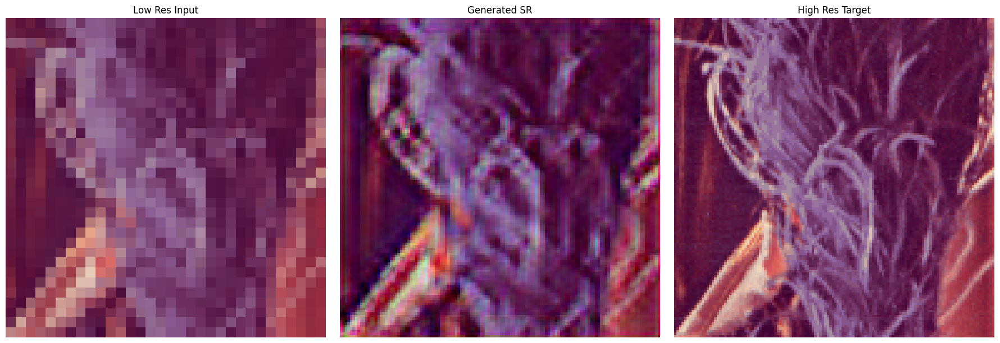

Epoch 50/50:   7%|▋         | 1/14 [00:01<00:13,  1.06s/it]

tensor(25.8246, device='cuda:0')   0.65629405


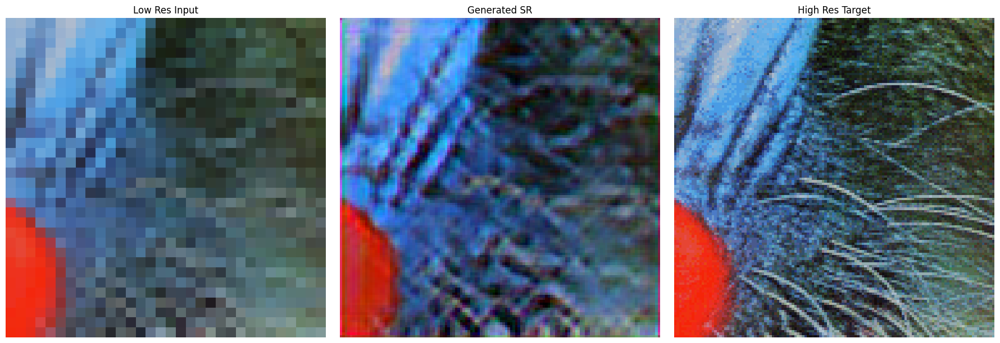

Epoch 50/50:  14%|█▍        | 2/14 [00:01<00:08,  1.42it/s]

tensor(23.6563, device='cuda:0')   0.47728363


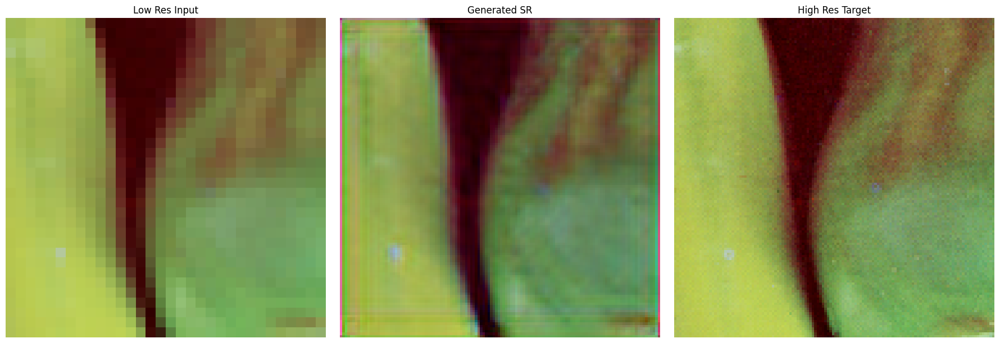

Epoch 50/50:  21%|██▏       | 3/14 [00:01<00:05,  1.84it/s]

tensor(28.2476, device='cuda:0')   0.82977945


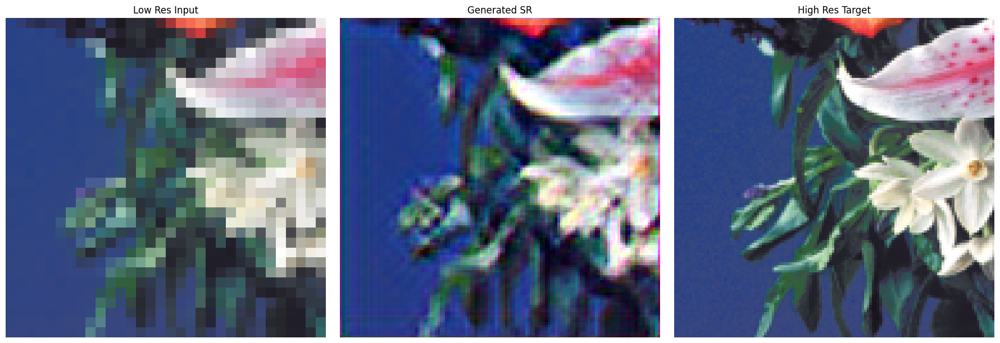

Epoch 50/50:  29%|██▊       | 4/14 [00:02<00:05,  1.99it/s]

tensor(25.4701, device='cuda:0')   0.71766216


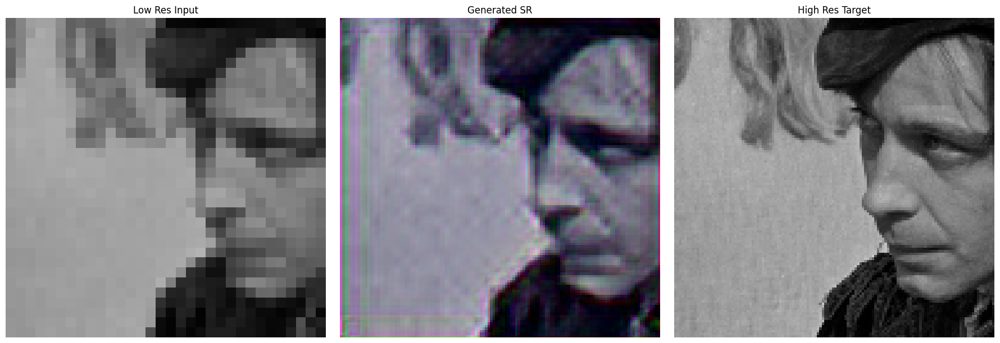

Epoch 50/50:  36%|███▌      | 5/14 [00:02<00:04,  2.08it/s]

tensor(28.5083, device='cuda:0')   0.7939539


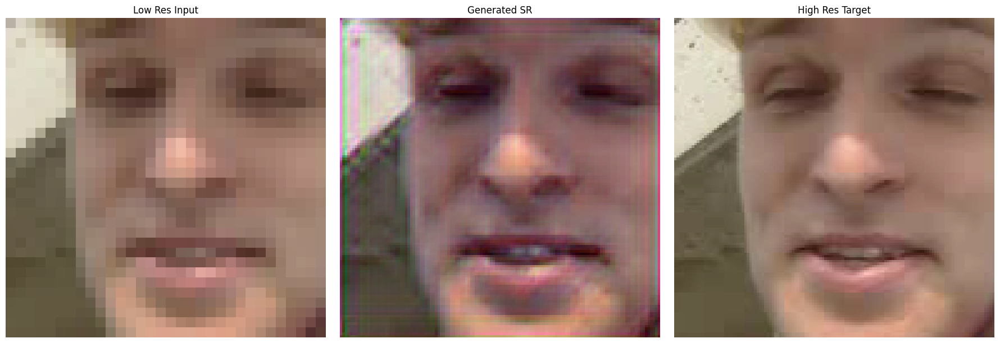

Epoch 50/50:  43%|████▎     | 6/14 [00:03<00:03,  2.15it/s]

tensor(28.9017, device='cuda:0')   0.8826712


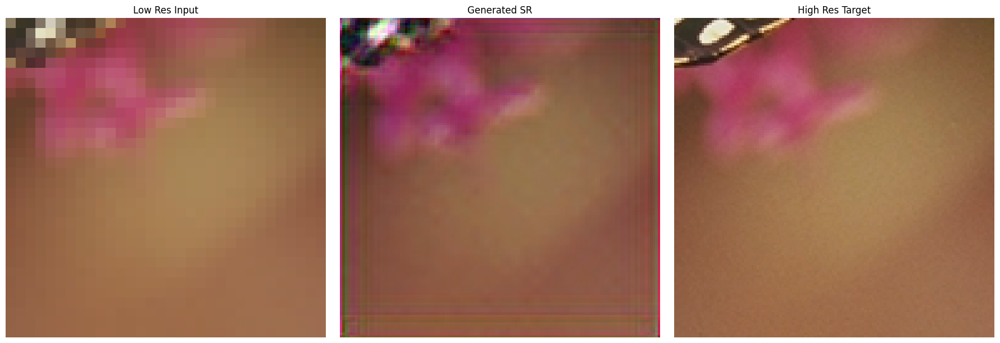

Epoch 50/50:  50%|█████     | 7/14 [00:03<00:02,  2.34it/s]

tensor(28.5093, device='cuda:0')   0.93143845


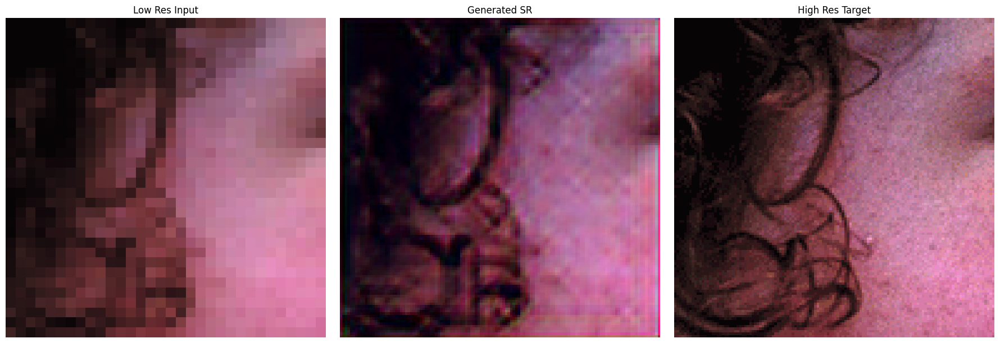

Epoch 50/50:  57%|█████▋    | 8/14 [00:03<00:02,  2.34it/s]

tensor(28.6319, device='cuda:0')   0.74940807


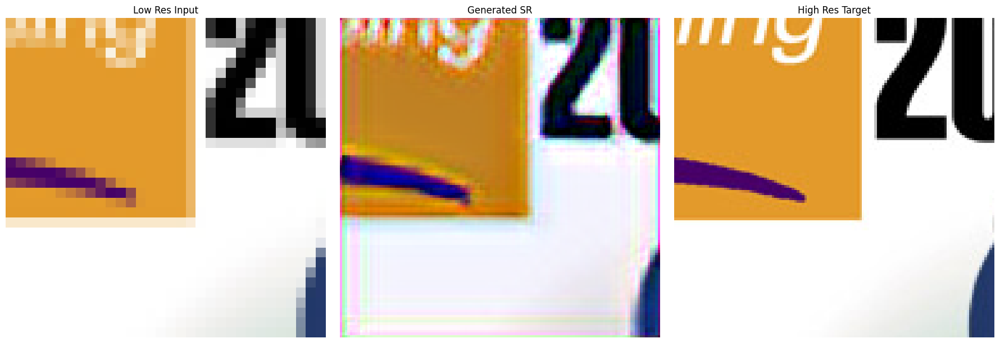

Epoch 50/50:  64%|██████▍   | 9/14 [00:04<00:02,  2.48it/s]

tensor(23.3902, device='cuda:0')   0.78450984


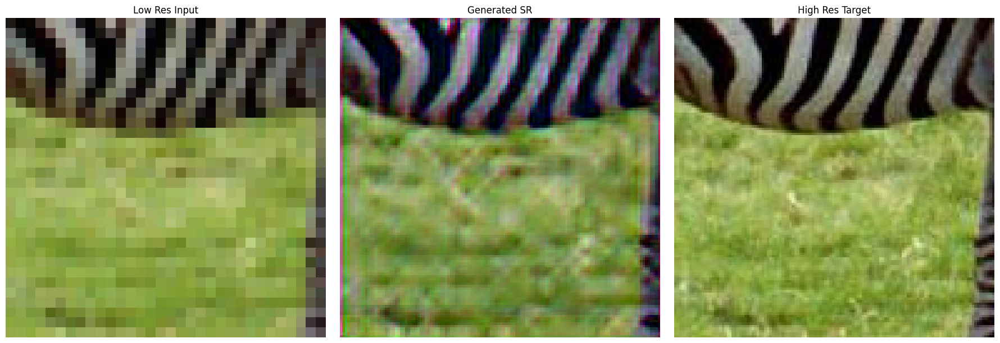

Epoch 50/50:  71%|███████▏  | 10/14 [00:04<00:01,  2.43it/s]

tensor(26.4582, device='cuda:0')   0.76558095


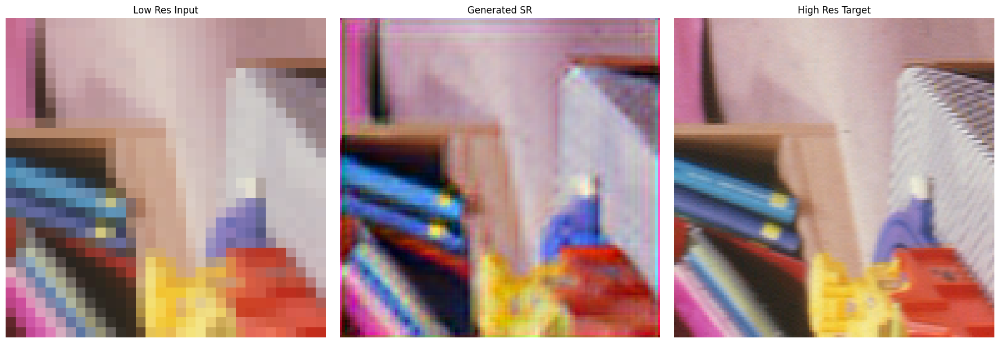

Epoch 50/50:  79%|███████▊  | 11/14 [00:05<00:01,  1.88it/s]

tensor(26.8960, device='cuda:0')   0.80647755


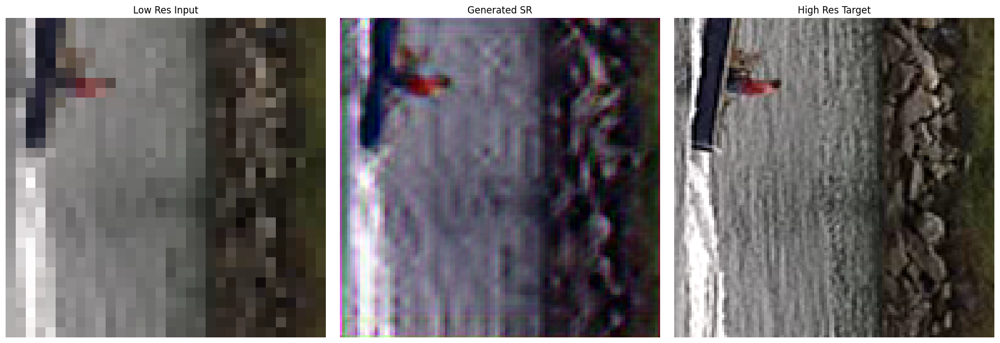

Epoch 50/50:  86%|████████▌ | 12/14 [00:05<00:01,  1.99it/s]

tensor(25.4120, device='cuda:0')   0.5876074


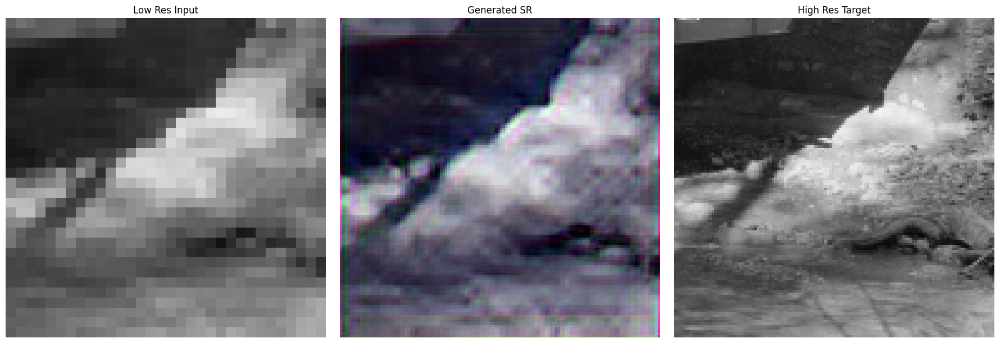

Epoch 50/50:  93%|█████████▎| 13/14 [00:06<00:00,  2.22it/s]

tensor(27.8146, device='cuda:0')   0.75288564


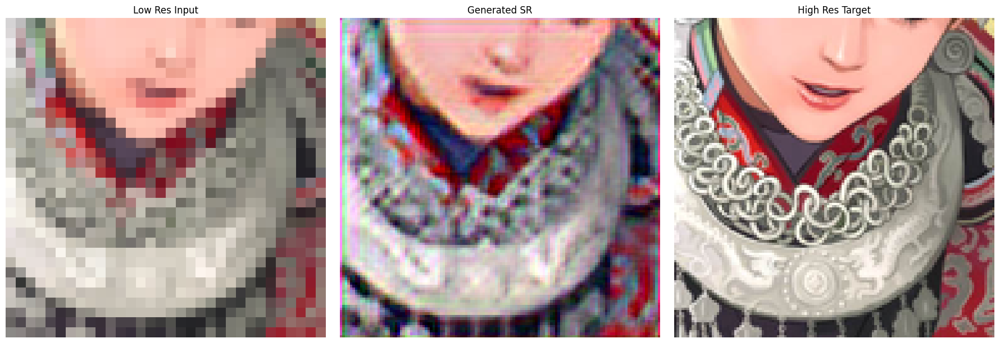

Epoch 50/50: 100%|██████████| 14/14 [00:06<00:00,  2.41it/s]

tensor(22.9354, device='cuda:0')   0.6058467


Epoch 50/50: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]

Average PSNR: 26.48 dB
Average SSIM: 0.7387


In [ ]:
testing_dataloader = torch.utils.data.DataLoader(val_dataset, num_workers=4, batch_size=1, shuffle=False, pin_memory=True)
iteration = tqdm(testing_dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=True)

total_psnr, total_ssim = 0, 0
Generator.eval()  # Set generator to evaluation mode

with torch.no_grad():  
    for batch_idx, (lr_batch, hr_batch) in enumerate(iteration):
        LR, HR = lr_batch.to(device), hr_batch.to(device)
        fake = Generator(LR).to(device)
        total_psnr += calculate_psnr(HR, fake)
        total_ssim += calculate_ssim(HR, fake)
        sample_fake = fake[0].cpu().detach().clamp(0, 1).permute(1, 2, 0).float().numpy()
        sample_lr = LR[0].cpu().detach().clamp(0, 1).permute(1, 2, 0).float().numpy()
        sample_hr = HR[0].cpu().detach().clamp(0, 1).permute(1, 2, 0).float().numpy()

        sample_fake = np.clip(sample_fake, 0, 1)
        sample_lr = np.clip(sample_lr, 0, 1)
        sample_hr = np.clip(sample_hr, 0, 1)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(sample_lr)
        axes[0].set_title("Low Res Input")
        axes[0].axis('off')

        axes[1].imshow(sample_fake)
        axes[1].set_title("Generated SR")
        axes[1].axis('off')

        axes[2].imshow(sample_hr)
        axes[2].set_title("High Res Target")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()
        print(calculate_psnr(HR, fake)," ",calculate_ssim(HR, fake))

average_psnr = total_psnr / len(testing_dataloader)
average_ssim = total_ssim / len(testing_dataloader)
print(f'Average PSNR: {average_psnr:.2f} dB')
print(f'Average SSIM: {average_ssim:.4f}')